# Shift mapping

This tutorial demonstrates...

Assume psf region and kernel maps already built

## Run photometry

In [15]:
import numpy as np
from pathlib import Path
from astropy.io import fits
from pathlib import Path
from astropy.io import fits
from mophongo.psf_map import PSFRegionMap
from mophongo.fit import FitConfig
from mophongo.catalog import Catalog
from mophongo import pipeline

data_dir = Path('../data')
#field = 'uds-test'
field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'

prm_kern = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_kernel_f770w.geojson'))
prm_444 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_psf.geojson'))
prm_770 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f770w_psf.geojson'))

# MIRI images
img_770 = fits.getdata(data_dir / f'{field}-f770w_sci.fits')
wht_770 = fits.getdata(data_dir / f'{field}-f770w_wht.fits')

# read in LW selected catalog
seg_LW = data_dir / f'{field}-LW_seg.fits'
cat444 = Catalog.from_fits(sci_444, wht_444, segmap=seg_LW, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, segmap=seg_LW, estimate_ivar=True) 

residual = [None, None, None, None]

Measuring inverse variance map...
Measuring inverse variance map...


### Separate flux and astrometric fit

First fit fluxes, then astrometric shift field, iterate.

In [10]:
# test astrometry fit vs number of iterations for separate astro + flux fits
config = FitConfig(fit_astrometry_niter=0)
table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual = [res[0]]

cfgs = ({'poly':{'order': 1}},
        {'poly':{'order': 3}},
        {'gp':{'length_scale': 400}})  # initial guess: GP will optimize length_scale
        
astrom = [None]
for mdict in cfgs:
    # test astrometry fit vs number of iterations for separate astro + flux fits
    model = next(iter(mdict))
    config = FitConfig(fit_astrometry_niter=3,
                       astrom_model=model,
                       astrom_kwargs=mdict)
    table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                   cat444.segmap.data,
                                   weights=[cat444.ivar, cat770.ivar],
                                   catalog=cat444.table,
                                   psfs=[prm_444, prm_770],
                                   kernels=[None, prm_kern],
                                   wcs=[cat444.wcs] * 2,
                                   config=config)
    residual.append(res[0])
    astrom.append(fit.astro)


Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=0, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 2}, 'gp': {'length_scale': 500}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 3652.27it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2670.96it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 1


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29269.71it/s]


Pipeline (residual) memory: 1.4 GB
Distribution >99% chi2: [1.92687833]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32287.93it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 1}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 5091.22it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2673.23it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 26361.48it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31567.81it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30211.83it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32151.22it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28706.49it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32494.20it/s]


Distribution >99% chi2: [1.88704709]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30264.33it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 3}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4748.07it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2785.47it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29309.34it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32389.10it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32905.28it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33485.71it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 34073.93it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29792.75it/s]


Distribution >99% chi2: [2.06737832]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31127.47it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'gp': {'length_scale': 400}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4831.83it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2811.65it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30727.50it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30008.13it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33406.12it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 34823.39it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 34134.90it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30295.81it/s]


Distribution >99% chi2: [2.31178147]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29580.43it/s]


Done...
Pipeline (end) memory: 1.4 GB


In [11]:
# from matplotlib import pyplot as plt
# t = fit.templates[0]
# plt.imshow(t.data)
# print(t.data.max(),t.data.dtype)

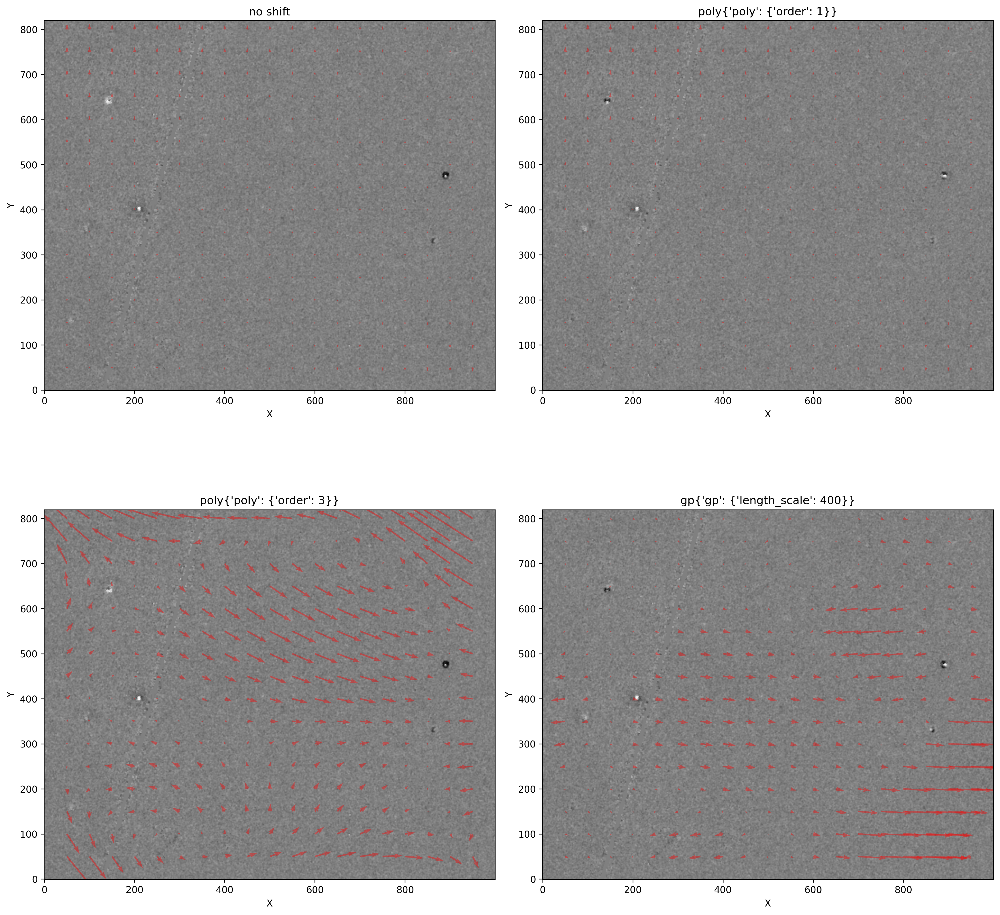

In [12]:
import numpy as np
import matplotlib.pyplot as plt

ny, nx = cat444.sci.shape
step = int(nx/20)
yg, xg = np.mgrid[step:ny:step, step:nx:step]
dx, dy = astrom[1](xg, yg)

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
ax[0].imshow(residual[0], origin='lower', cmap='gray', vmin=-1,vmax=1)
ax[0].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
ax[0].set_title("no shift") ; ax[0].set_xlabel("X") ; ax[0].set_ylabel("Y")
#ax[1].axis('off')

for i in range(1, len(ax)):
    dx, dy = astrom[i](xg, yg)
    ax[i].imshow(residual[i], origin='lower', cmap='gray', vmin=-1,vmax=1)
    ax[i].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
    ax[i].set_title(astrom[i].cfg.astrom_model+str(astrom[i].cfg.astrom_kwargs)) ; ax[i].set_xlabel("X") ; ax[i].set_ylabel("Y")
plt.tight_layout()
plt.show()

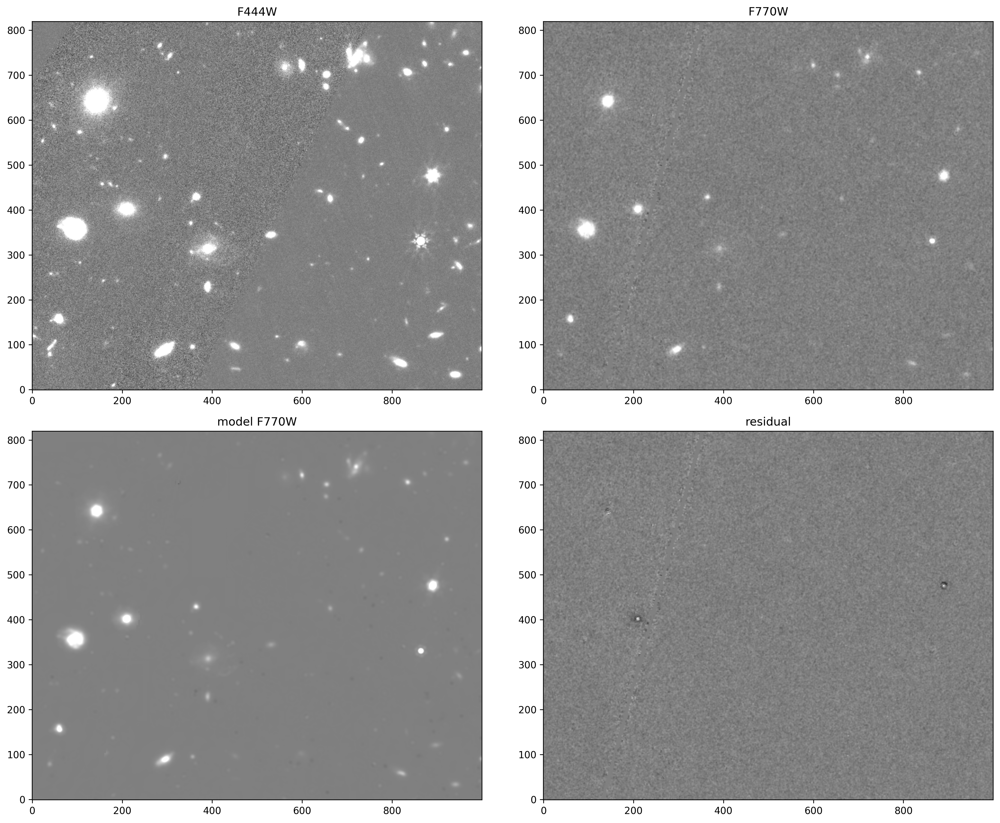

In [13]:
from matplotlib import pyplot as plt
img = [cat444.sci*5, cat770.sci, cat770.sci - residual[1], residual[1]] 
titles = ['F444W', 'F770W', 'model F770W', 'residual']
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
for i in range(4):
    ax[i].imshow(img[i], origin='lower', cmap='gray', vmin=-1, vmax=1)
    ax[i].set_title(f'{titles[i]}')
plt.tight_layout() 

In [14]:
mdict = {'poly':{'order': 3}}

In [6]:
cfgs = ({'poly':{'order': 1}},
        {'poly':{'order': 3}},
        {'gp':{'length_scale': 400}})  # initial guess: GP will optimize length_scale
        
for mdict in cfgs:
    # test astrometry fit vs number of iterations for separate astro + flux fits
    model = next(iter(mdict))
    config = FitConfig(fit_astrometry_niter=3,
                       astrom_model=model,
                       astrom_centroid='correlation',
                       astrom_kwargs=mdict)
    table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                   cat444.segmap.data,
                                   weights=[cat444.ivar, cat770.ivar],
                                   catalog=cat444.table,
                                   psfs=[prm_444, prm_770],
                                   kernels=[None, prm_kern],
                                   wcs=[cat444.wcs] * 2,
                                   config=config)
    residual.append(res[0])
    astrom.append(fit.astro)

Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='correlation', astrom_kwargs={'poly': {'order': 1}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4336.97it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2541.98it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 21505.50it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 24073.69it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28340.39it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31019.60it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30854.13it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 27342.64it/s]


Distribution >99% chi2: [4.86565667]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32339.42it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='correlation', astrom_kwargs={'poly': {'order': 3}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4692.37it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 1827.50it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30472.12it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30052.60it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28283.86it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30123.79it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28139.80it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29986.79it/s]


Distribution >99% chi2: [4.49575515]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30173.71it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='correlation', astrom_kwargs={'gp': {'length_scale': 400}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4807.04it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2824.17it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31411.85it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31357.75it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29859.93it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33547.41it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32090.05it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 34007.39it/s]


Distribution >99% chi2: [3.9541216]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33736.01it/s]


Done...
Pipeline (end) memory: 1.4 GB


In [7]:
k = mdict.keys()

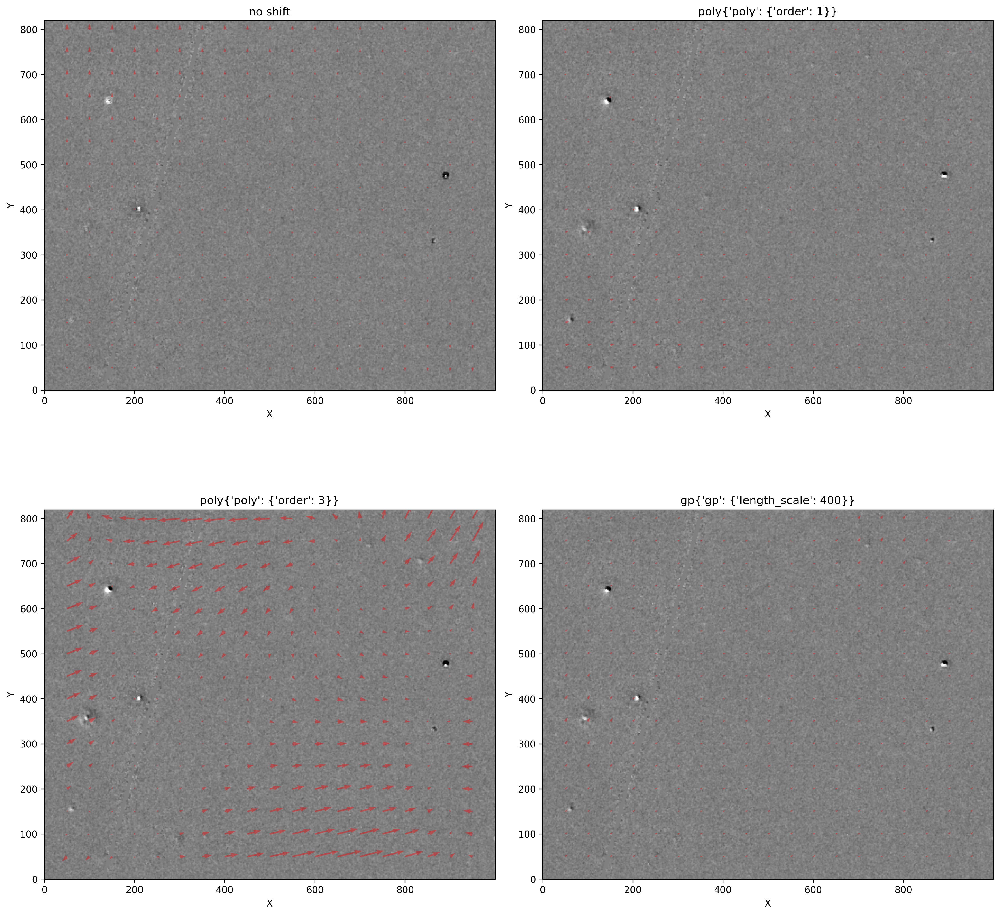

In [8]:
import numpy as np
import matplotlib.pyplot as plt

ny, nx = cat444.sci.shape
step = int(nx/20)
yg, xg = np.mgrid[step:ny:step, step:nx:step]
dx, dy = astrom[1](xg, yg)

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
ax[0].imshow(residual[0], origin='lower', cmap='gray', vmin=-1,vmax=1)
ax[0].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
ax[0].set_title("no shift") ; ax[0].set_xlabel("X") ; ax[0].set_ylabel("Y")
#ax[1].axis('off')

for i in range(1, len(ax)):
    dx, dy = astrom[i+3](xg, yg)
    ax[i].imshow(residual[i+3], origin='lower', cmap='gray', vmin=-1,vmax=1)
    ax[i].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
    ax[i].set_title(astrom[i].cfg.astrom_model+str(astrom[i].cfg.astrom_kwargs)) ; ax[i].set_xlabel("X") ; ax[i].set_ylabel("Y")
plt.tight_layout()
plt.show()

In [12]:
len(residual), len(astrom)

(7, 7)